## Function to analyze and print recommendations

### Load and Prepare the Data

In [1]:
# Import necessary libraries.
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
df=pd.read_csv("online_retail.csv")

In [3]:
# Check dataframe information.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [4]:
# Read header of dataframe.
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [5]:
# Check any column containing the null value.
df.isnull().any()

InvoiceNo      False
StockCode      False
Description     True
Quantity       False
InvoiceDate    False
UnitPrice      False
CustomerID      True
Country        False
dtype: bool

In [6]:
# Count the number of null value records in the CustomerID column.
df['CustomerID'].isna().sum()

135080

In [7]:
df1 = df.dropna(subset=['CustomerID'])

In [8]:
# Check data frame information.
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    406829 non-null  object 
 1   StockCode    406829 non-null  object 
 2   Description  406829 non-null  object 
 3   Quantity     406829 non-null  int64  
 4   InvoiceDate  406829 non-null  object 
 5   UnitPrice    406829 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      406829 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 27.9+ MB


In [9]:
df1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


### Create CustomerID vs product (Purchased product, by StockCode) matrix by pivot table function.

In [10]:
 CustomerID_product_matrix = df1.pivot_table(
    index='CustomerID', 
    columns='StockCode', 
    values='Quantity',
    aggfunc='sum'
)

In [11]:
# Display the shape of matrix
CustomerID_product_matrix.shape

(4372, 3684)

In [12]:
# Update illustration of the matrix
CustomerID_product_matrix = CustomerID_product_matrix.applymap(lambda x: 1 if x > 0 else 0)

C:\Users\acer\AppData\Local\Temp\ipykernel_7700\3395501318.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  CustomerID_product_matrix = CustomerID_product_matrix.applymap(lambda x: 1 if x > 0 else 0)


In [13]:
# Read header of CustomerID vs product matrix.
CustomerID_product_matrix.loc[12680:].head()

StockCode,10002,10080,10120,10123C,10124A,10124G,10125,10133,10135,11001,...,90214Y,90214Z,BANK CHARGES,C2,CRUK,D,DOT,M,PADS,POST
CustomerID,,,,,,,,,,,,,,,,,,,,,
12680.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12681.0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12682.0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12683.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12684.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1


### Calculate the User similarity by Cosine Similarity

In [14]:
 user_similarity_matrix = pd.DataFrame(cosine_similarity(CustomerID_product_matrix))

In [15]:
# Display header of User to User similarity matrix. 
user_similarity_matrix.head()

,0,1,2,3,4,5,6,7,8,9,...,4362,4363,4364,4365,4366,4367,4368,4369,4370,4371
0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
1,0.0,1.000000,0.063022,0.046130,0.047795,0.038814,0.0,0.025876,0.136641,0.094742,...,0.0,0.0,0.054656,0.0,0.032844,0.062318,0.0,0.113776,0.109364,0.012828
2,0.0,0.063022,1.000000,0.024953,0.051709,0.027995,0.0,0.027995,0.118262,0.146427,...,0.0,0.0,0.118262,0.0,0.000000,0.000000,0.0,0.000000,0.170905,0.083269
3,0.0,0.046130,0.024953,1.000000,0.056773,0.138314,0.0,0.030737,0.032461,0.144692,...,0.0,0.0,0.000000,0.0,0.039014,0.000000,0.0,0.067574,0.137124,0.030475
4,0.0,0.047795,0.051709,0.056773,1.000000,0.031846,0.0,0.000000,0.000000,0.033315,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.044866,0.000000


In [16]:
# Update index to corresponding CustomerID.
user_similarity_matrix.columns = CustomerID_product_matrix.index
user_similarity_matrix['CustomerID'] = CustomerID_product_matrix.index
user_similarity_matrix = user_similarity_matrix.set_index('CustomerID')

In [17]:
# Display header of User to User similarity matrix. 
user_similarity_matrix.head()

CustomerID,12346.0,12347.0,12348.0,12349.0,12350.0,12352.0,12353.0,12354.0,12355.0,12356.0,...,18273.0,18274.0,18276.0,18277.0,18278.0,18280.0,18281.0,18282.0,18283.0,18287.0
CustomerID,,,,,,,,,,,,,,,,,,,,,
12346.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
12347.0,0.0,1.000000,0.063022,0.046130,0.047795,0.038814,0.0,0.025876,0.136641,0.094742,...,0.0,0.0,0.054656,0.0,0.032844,0.062318,0.0,0.113776,0.109364,0.012828
12348.0,0.0,0.063022,1.000000,0.024953,0.051709,0.027995,0.0,0.027995,0.118262,0.146427,...,0.0,0.0,0.118262,0.0,0.000000,0.000000,0.0,0.000000,0.170905,0.083269
12349.0,0.0,0.046130,0.024953,1.000000,0.056773,0.138314,0.0,0.030737,0.032461,0.144692,...,0.0,0.0,0.000000,0.0,0.039014,0.000000,0.0,0.067574,0.137124,0.030475
12350.0,0.0,0.047795,0.051709,0.056773,1.000000,0.031846,0.0,0.000000,0.000000,0.033315,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.044866,0.000000


In [18]:
# Randomly pick CustomerID (12702) to display the most similar CustomerID.
user_similarity_matrix.loc[12702.0].sort_values(ascending=False)

CustomerID
12702.0    1.000000
14608.0    0.510310
15758.0    0.481125
18259.0    0.444444
15434.0    0.427121
             ...   
14895.0    0.000000
14896.0    0.000000
14897.0    0.000000
14898.0    0.000000
15301.0    0.000000
Name: 12702.0, Length: 4372, dtype: float64

In [19]:
# Display CustomerID (12702) purchased items.
product_purchased_by_X = set(CustomerID_product_matrix.loc[12702.0].iloc[CustomerID_product_matrix.loc[12702.0].to_numpy().nonzero()].index)
product_purchased_by_X

{'21479',
 '21481',
 '22111',
 '22113',
 '22114',
 '22835',
 '23355',
 '23356',
 '23357',
 '23439',
 '84032A',
 'POST'}

In [23]:
# Display CustomerID (14608) purchased product.
product_purchased_by_Y = set(CustomerID_product_matrix.loc[14608.0].iloc[CustomerID_product_matrix.loc[14608.0].to_numpy().nonzero()].index)
product_purchased_by_Y

{'21481', '22111', '22112', '22114', '22207', '23355', '23357', '84029E'}

In [24]:
# Find out product which purchased by X (12702) but not yet purchased by Y (14608).
product_to_recommend_to_Y = product_purchased_by_X - product_purchased_by_Y

In [25]:
# Display the list of product recommended for Y (14608).
product_to_recommend_to_Y

{'21479', '22113', '22835', '23356', '23439', '84032A', 'POST'}

In [26]:
# Display the list of product recommended for Y (14608) with item Description.
df1.loc[df1['StockCode'].isin(product_to_recommend_to_Y), ['StockCode', 'Description']].drop_duplicates().set_index('StockCode')

,Description
StockCode,
POST,POSTAGE
22835,HOT WATER BOTTLE I AM SO POORLY
21479,WHITE SKULL HOT WATER BOTTLE
22113,GREY HEART HOT WATER BOTTLE
84032A,CHARLIE+LOLA PINK HOT WATER BOTTLE
23356,LOVE HOT WATER BOTTLE
23439,HAND WARMER RED LOVE HEART


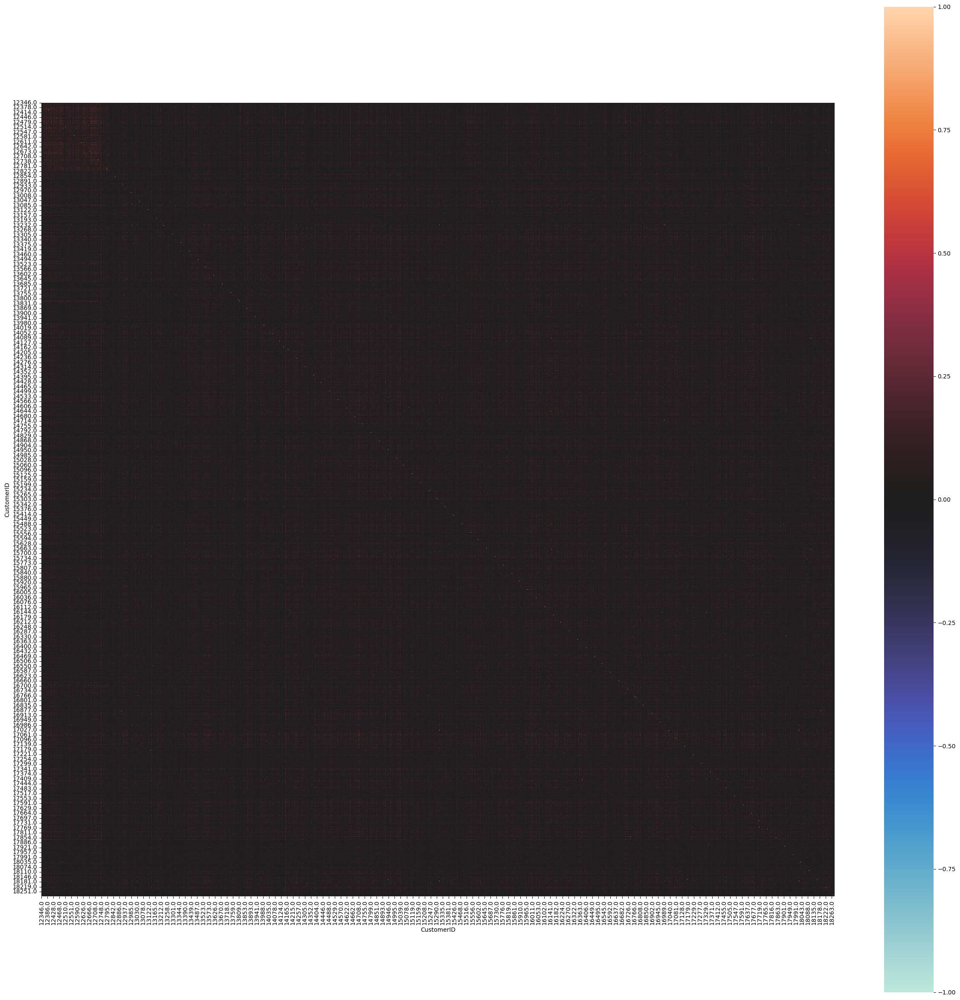

In [34]:
#display the User to User similarity matrix.
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (30,30))
ax = sns.heatmap(user_similarity_matrix, vmin=-1, vmax=1, center=0,square=True)

### Calculate the product similarity by Cosine Similarity

In [49]:
# Create product similarity matrix.
product_similarity_matrix = pd.DataFrame(
    cosine_similarity(CustomerID_product_matrix.T)
)

In [36]:
# Display header of product similarity matrix. 
product_similarity_matrix.head()

,0,1,2,3,4,5,6,7,8,9,...,3674,3675,3676,3677,3678,3679,3680,3681,3682,3683
0,1.000000,0.0,0.094868,0.091287,0.0,0.000000,0.090351,0.063246,0.098907,0.095346,...,0.0,0.0,0.0,0.029361,0.0,0.0,0.0,0.059423,0.0,0.070057
1,0.000000,1.0,0.000000,0.000000,0.0,0.000000,0.032774,0.045883,0.047836,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.017244,0.0,0.000000
2,0.094868,0.0,1.000000,0.115470,0.0,0.000000,0.057143,0.060000,0.041703,0.060302,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.075165,0.0,0.000000
3,0.091287,0.0,0.115470,1.000000,0.0,0.000000,0.164957,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
4,0.000000,0.0,0.000000,0.000000,1.0,0.447214,0.063888,0.044721,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000


In [37]:
# Update index to corresponding  (StockCode).
product_similarity_matrix.columns = CustomerID_product_matrix.T.index
product_similarity_matrix['StockCode'] = CustomerID_product_matrix.T.index
product_similarity_matrix = product_similarity_matrix.set_index('StockCode')

In [38]:
# Display product similarity
product_similarity_matrix.head()

StockCode,10002,10080,10120,10123C,10124A,10124G,10125,10133,10135,11001,...,90214Y,90214Z,BANK CHARGES,C2,CRUK,D,DOT,M,PADS,POST
StockCode,,,,,,,,,,,,,,,,,,,,,
10002,1.000000,0.0,0.094868,0.091287,0.0,0.000000,0.090351,0.063246,0.098907,0.095346,...,0.0,0.0,0.0,0.029361,0.0,0.0,0.0,0.059423,0.0,0.070057
10080,0.000000,1.0,0.000000,0.000000,0.0,0.000000,0.032774,0.045883,0.047836,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.017244,0.0,0.000000
10120,0.094868,0.0,1.000000,0.115470,0.0,0.000000,0.057143,0.060000,0.041703,0.060302,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.075165,0.0,0.000000
10123C,0.091287,0.0,0.115470,1.000000,0.0,0.000000,0.164957,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
10124A,0.000000,0.0,0.000000,0.000000,1.0,0.447214,0.063888,0.044721,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000


In [39]:
product_similarity_matrix.index

Index(['10002', '10080', '10120', '10123C', '10124A', '10124G', '10125',
       '10133', '10135', '11001',
       ...
       '90214Y', '90214Z', 'BANK CHARGES', 'C2', 'CRUK', 'D', 'DOT', 'M',
       'PADS', 'POST'],
      dtype='object', name='StockCode', length=3684)

In [40]:
# Randomly pick StockCode (10125) to display the most similar StockCode.

try:
    top_10_similar_product = list(product_similarity_matrix.loc['10125'].sort_values(ascending=False).iloc[:10].index)
except Exception as e:
    print("Index 10125 not found in the metrix.")
    


In [41]:
# Display top 10 similar product of StockCode (10125).
top_10_similar_product

['10125',
 '21883',
 '21882',
 '16161U',
 '21884',
 '21880',
 '22333',
 '10123C',
 '21244',
 '35597A']

In [42]:
# Display the list of similar product of StockCode (10125) with item Description.
df1.loc[
    df1['StockCode'].isin(top_10_similar_product), 
    ['StockCode', 'Description']
].drop_duplicates().set_index('StockCode').loc[top_10_similar_product]

,Description
StockCode,
10125,MINI FUNKY DESIGN TAPES
21883,STARS GIFT TAPE
21882,SKULLS TAPE
16161U,WRAP SUKI AND FRIENDS
21884,CAKES AND BOWS GIFT TAPE
21880,RED RETROSPOT TAPE
22333,RETROSPOT PARTY BAG + STICKER SET
10123C,HEARTS WRAPPING TAPE
21244,BLUE POLKADOT PLATE


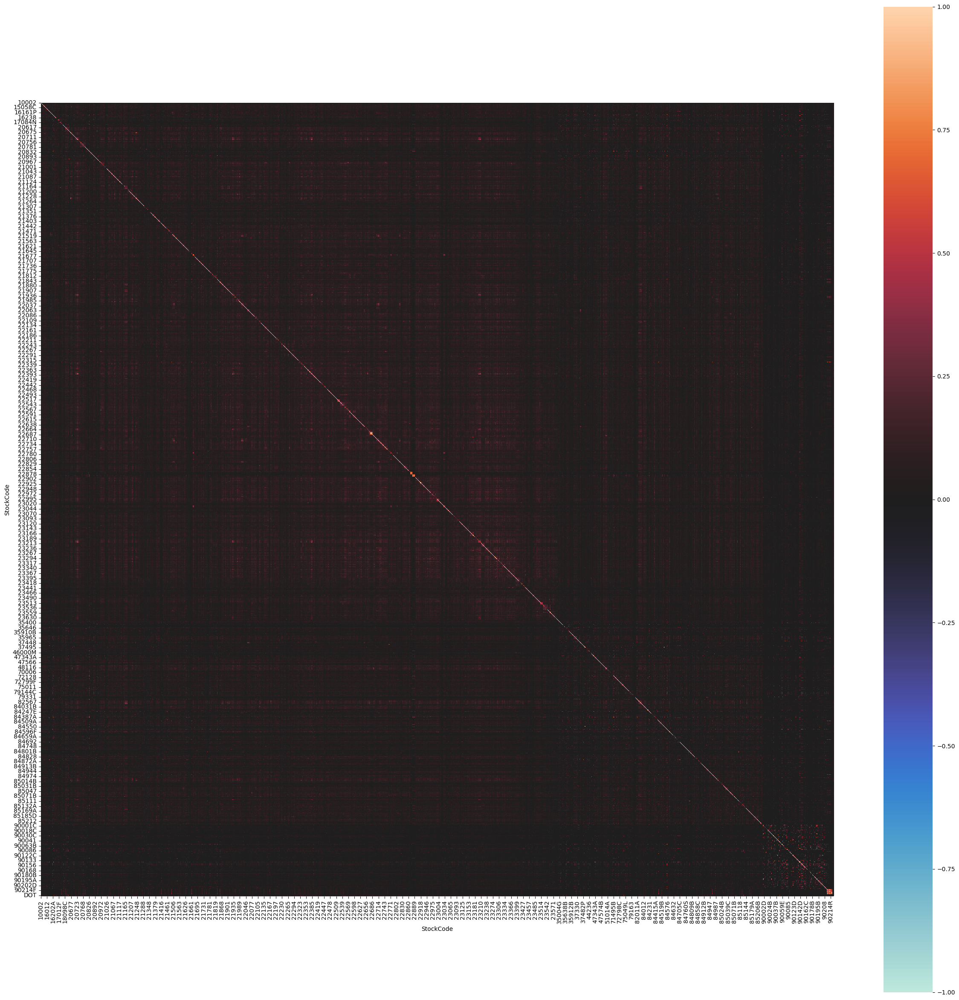

In [43]:
# display the product similarity matrix.
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (30,30))
ax = sns.heatmap(product_similarity_matrix, vmin=-1, vmax=1, center=0,square=True)

In [44]:
# Pivot Table: products vs customers
pivot=df.pivot_table(index='Description', values='Quantity', columns='CustomerID', aggfunc='sum').fillna(1)

In [45]:
# cosine similarity
product_similarity=cosine_similarity(pivot)
product_similarity_df=pd.DataFrame(product_similarity, index=pivot.index, columns=pivot.index)

In [46]:
#function to get  similar products
def get_similar_products(product_name, top_n=5):
    if product_name not in product_similarity_df:
        return "product not found"
    sim_scores=product_similarity_df[product_name].sort_values(ascending=False)[1:top_n+1]
    return sim_scores

print(get_similar_products('WHITE METAL LANTERN'))     

Description
RED RETROSPOT SUGAR JAM BOWL     0.544220
EGG CUP HENRIETTA HEN CREAM      0.540634
50'S CHRISTMAS GIFT BAG LARGE    0.539030
EGG CUP MILKMAID HEIDI           0.536081
RED RETROSPOT SMALL MILK JUG     0.528052
Name: WHITE METAL LANTERN, dtype: float64


### Prediction Engine

In [47]:
# Feature engineering
df['TotalPrice']=df['Quantity']*df['UnitPrice']
model_data=df[['CustomerID','StockCode', 'Quantity', 'UnitPrice', 'TotalPrice']]

In [48]:
#Convert caategorical IDs

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

model_data.dropna(subset=['CustomerID'],inplace=True)
model_data.loc[:,'CustomerID']=model_data['CustomerID'].astype('int')
model_data.loc[:, 'StockCode']=model_data['StockCode'].astype('category').cat.codes

x=model_data[['CustomerID', 'StockCode', 'UnitPrice']]
y=model_data['Quantity']

x_train, x_test, y_train, y_test=train_test_split(x,y, test_size=0.2)

model=LinearRegression()
model.fit(x_train, y_train)

#predict 
y_pred=model.predict(x_test)
print("sample prediction:")
print(y_pred[:8])

C:\Users\acer\AppData\Local\Temp\ipykernel_7700\919845912.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  model_data.dropna(subset=['CustomerID'],inplace=True)


sample prediction:
[10.89136627 11.94379155 11.46882951 13.28753816 11.96560227 13.25436776
 10.66186    10.13651353]
